- NASA SOH prediction
- NASA Transfer learning

## Dataset
- NASA 18650 Li-ion battery group (RW17, 18, 19, 20)

#### RW17, 18, 19, 20
- Reference cycle : 50번의 RW cycle 이후 배터리 건강 상태 측정을 위한 reference cycle 시행
    - ref A : 0.04A low current discharge
    - ref B : CC-CV charge(2A, 4.2V), CC discharge(2A)
    - ref C : pulsed current discharge (10분간 1A방전, 20분간 rest)

##
- Random walk cycle(RW cycle) : 4.2V까지 충전이 완료된 배터리를 3.2V까지 1분마다 전류를 랜덤하게 바꿔가며 방전
    - 0.5A ~ 5.0A 사이 전류가 정해진 확률에 따라 방전 (right skewed RW discharge)
    
|Discharge Current|Probability|
|---|---|
| 0.5A | 2.0% |
| 1.0A | 2.4% |
| 1.5A | 3.6% |
| 2.0A | 6.0% |
| 2.5A | 9.2% |
| 3.0A | 11.8% |
| 3.5A | 17.2% |
| 4.0A | 23.4% |
| 4.5A | 19.4% |
| 5.0A | 5.0% |


## Preprocess

1. reference/random cycle 분류
2. cycle numbering
3. capacity
4. SOH


In [1]:
import imageio,os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import torch
import torch.nn as nn
from typing import *
from torch.utils.data import Dataset, DataLoader
import argparse
import logging
from datetime import datetime


import sys
sys.path.append('/home/ev/ksiam/')


import natsort
from PIL import Image
from IPython.display import Image as Img
from IPython.display import display
from matplotlib.animation import FuncAnimation



DATA_ROOT = '/data/ev/NASA'

## Raw data

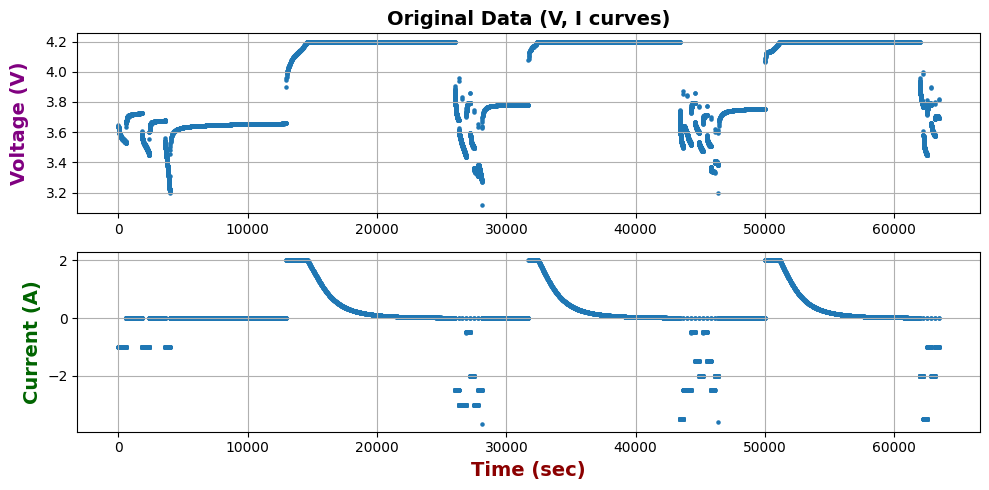

In [2]:
def cycle_plot(df, start_cyle, end_cycle):
    df['I'] = -df['I']
    
    # cycle numbering
    df['N'] = np.where(df['charge_type'] != df['charge_type'].shift(1), 1, 0)
    df.loc[0, 'N'] = 0
    df['N'] = df['N'].cumsum()
    
    
    
    ref = df.loc[(df['N'] >= start_cycle) & (df['N'] <= end_cycle)]
    first_t = ref['t'].iloc[0]
    _ref_t = ref['t'].values - first_t
    _ref_v = ref['V'].values
    _ref_i = ref['I'].values
    
    fig = plt.figure(figsize=(10, 5))
    plt.title(f'Original Data (V, I curves)', fontdict={'family': 'Sans-serif', 'color': 'black', 'weight': 'bold', 'size': 14})
    plt.axis('off')

    ax = fig.add_subplot(211)
    ax.scatter(_ref_t, _ref_v, s=5)
    ax.set_ylabel('Voltage (V)', labelpad=12, fontdict={'family': 'Sans-serif', 'color': 'purple', 'weight': 'bold', 'size': 14})
    ax.grid()
    
    ax = fig.add_subplot(212)
    ax.scatter(_ref_t, _ref_i, s=5)
    ax.set_xlabel('Time (sec)', fontdict={'family': 'Sans-serif', 'color': 'darkred', 'weight': 'bold', 'size': 14})
    ax.set_ylabel('Current (A)', fontdict={'family': 'Sans-serif', 'color': 'darkgreen', 'weight': 'bold', 'size': 14})
    ax.grid()
    
    plt.tight_layout()
    plt.show()
    

df = pd.read_parquet(os.path.join(DATA_ROOT, 'original', 'RW06.parquet'))    



start_cycle = 30
end_cycle = 90
# RW06 reference cycle (ref A) : 0~2
# RW06 reference cycle (ref B) : 3~10, 862~869, 1651~1658, ...
# RW06 reference cycle (ref C) : 11~35, 870~894, 1659~1683, ...
# RW06 random walk cycle : 36~861, 896~1650, ...

cycle_plot(df, start_cyle=start_cycle, end_cycle=end_cycle)

## preprocessed data (reference cycle)

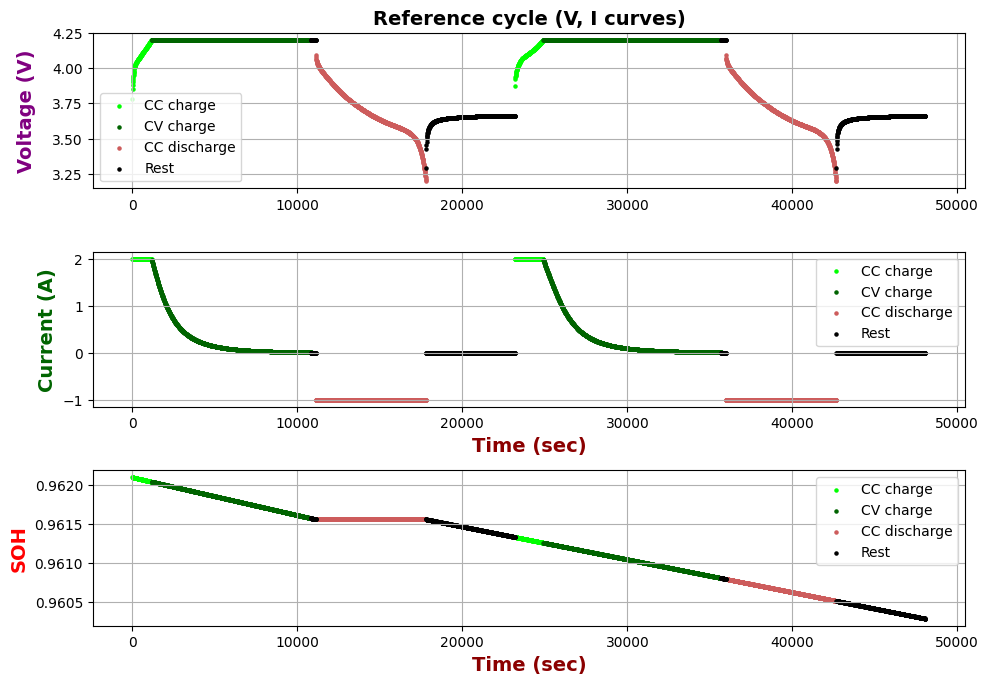

In [3]:
df = pd.read_parquet(os.path.join(DATA_ROOT, 'processed', 'RW06.parquet'))

# RW06 reference cycle (ref A) : 0~2
# RW06 reference cycle (ref B) : 3~10, 862~869, 1651~1658, ...
# RW06 reference cycle (ref C) : 11~35, 870~894, 1659~1683, ...
ref = df.loc[(df['N'] >= 862) & (df['N'] <= 869)]

first_t = ref['t'].iloc[0]
_cc = ref.loc[(ref['I'] >= 1.99) & (ref['charge_type'] == 'reference charge'), :]
_cv = ref.loc[(ref['I'] < 1.99) & (ref['charge_type'] == 'reference charge'), :]
_cc_t = _cc['t'].values - first_t
_cc_v = _cc['V'].values
_cc_i = _cc['I'].values
_cv_t = _cv['t'].values - first_t
_cv_v = _cv['V'].values
_cv_i = _cv['I'].values
_d = ref.loc[(ref['I'] < -0.5), :]
_d_t = _d['t'].values - first_t
_d_v = _d['V'].values
_d_i = _d['I'].values
_r = ref.loc[ref['charge_type'].apply(lambda x: x.startswith('rest')), :]
_r_t = _r['t'].values - first_t
_r_v = _r['V'].values
_r_i = _r['I'].values
_cc_soh = _cc['SOH'].values
_cv_soh = _cv['SOH'].values
_d_soh = _d['SOH'].values
_r_soh = _r['SOH'].values

fig = plt.figure(figsize=(10, 7))
plt.title(f'Reference cycle (V, I curves)', fontdict={'family': 'Sans-serif', 'color': 'black', 'weight': 'bold', 'size': 14})
plt.axis('off')


ax = fig.add_subplot(311)
ax.scatter(_cc_t, _cc_v, s=5, c='lime', label='CC charge')
ax.scatter(_cv_t, _cv_v, s=5, c='darkgreen', label='CV charge')
ax.scatter(_d_t, _d_v, s=5, c='indianred', label='CC discharge')
ax.scatter(_r_t, _r_v, s=5, c='black', label='Rest')
ax.set_ylabel('Voltage (V)', labelpad=12, fontdict={'family': 'Sans-serif', 'color': 'purple', 'weight': 'bold', 'size': 14})
ax.grid()
ax.legend()

ax = fig.add_subplot(312)
ax.scatter(_cc_t, _cc_i, s=5, c='lime', label='CC charge')
ax.scatter(_cv_t, _cv_i, s=5, c='darkgreen', label='CV charge')
ax.scatter(_d_t, _d_i, s=5, c='indianred', label='CC discharge')
ax.scatter(_r_t, _r_i, s=5, c='black', label='Rest')
ax.set_xlabel('Time (sec)', fontdict={'family': 'Sans-serif', 'color': 'darkred', 'weight': 'bold', 'size': 14})
ax.set_ylabel('Current (A)', fontdict={'family': 'Sans-serif', 'color': 'darkgreen', 'weight': 'bold', 'size': 14})
ax.grid()
ax.legend()

ax = fig.add_subplot(313)
ax.scatter(_cc_t, _cc_soh, s=5, c='lime', label='CC charge')
ax.scatter(_cv_t, _cv_soh, s=5, c='darkgreen', label='CV charge')
ax.scatter(_d_t, _d_soh, s=5, c='indianred', label='CC discharge')
ax.scatter(_r_t, _r_soh, s=5, c='black', label='Rest')
ax.set_xlabel('Time (sec)', fontdict={'family': 'Sans-serif', 'color': 'darkred', 'weight': 'bold', 'size': 14})
ax.set_ylabel('SOH', fontdict={'family': 'Sans-serif', 'color': 'red', 'weight': 'bold', 'size': 14})
ax.grid()
ax.legend()

plt.tight_layout()
plt.show()

## preprocessed data (random cycle)

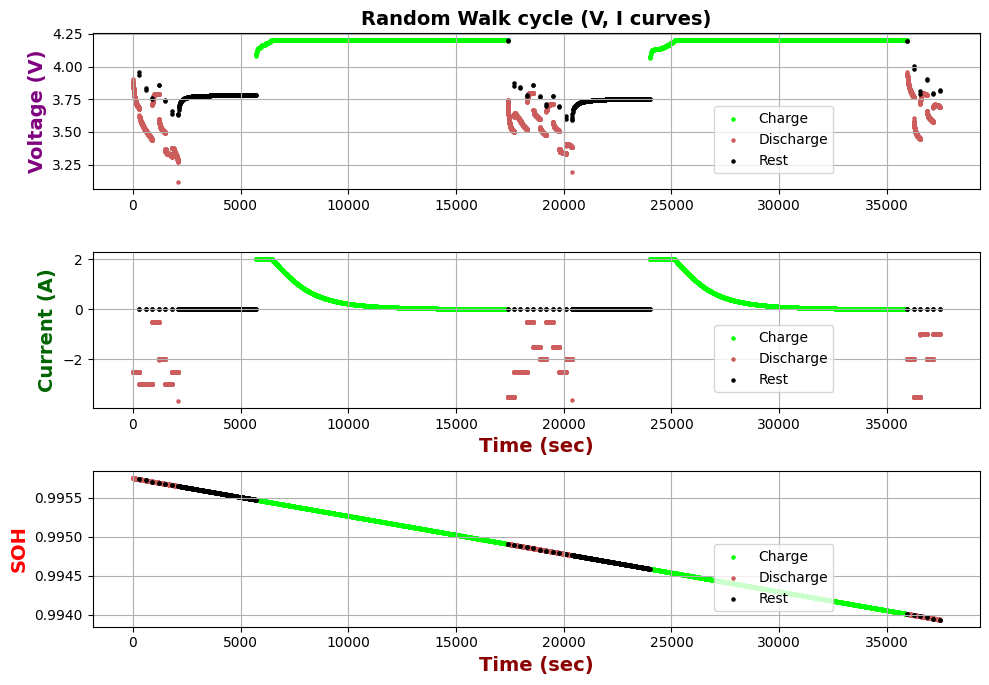

In [4]:
df = pd.read_parquet(os.path.join(DATA_ROOT, 'processed', 'RW06.parquet'))

# RW06 random walk cycle : 36~861, 896~1650, ...
rw = df.loc[(df['N'] >= 39) & (df['N'] <= 90)]
first_t = rw['t'].iloc[0]
_c = rw.loc[rw['I'] > 0, :]
_d = rw.loc[rw['I'] < 0, :]
_r = rw.loc[rw['I'] == 0, :]
_c_t = _c['t'].values - first_t
_c_v = _c['V'].values
_c_i = _c['I'].values
_d_t = _d['t'].values - first_t
_d_v = _d['V'].values
_d_i = _d['I'].values
_r_t = _r['t'].values - first_t
_r_v = _r['V'].values
_r_i = _r['I'].values
_c_soh = _c['SOH'].values
_d_soh = _d['SOH'].values
_r_soh = _r['SOH'].values

fig = plt.figure(figsize=(10, 7))
plt.title(f'Random Walk cycle (V, I curves)', fontdict={'family': 'Sans-serif', 'color': 'black', 'weight': 'bold', 'size': 14})
plt.axis('off')

ax = fig.add_subplot(311)
ax.scatter(_c_t, _c_v, s=5, c='lime', label='Charge')
ax.scatter(_d_t, _d_v, s=5, c='indianred', label='Discharge')
ax.scatter(_r_t, _r_v, s=5, c='black', label='Rest')
ax.set_ylabel('Voltage (V)', labelpad=4, fontdict={'family': 'Sans-serif', 'color': 'purple', 'weight': 'bold', 'size': 14})
ax.grid()
ax.legend(loc=(0.7, 0.1))

ax = fig.add_subplot(312)
ax.scatter(_c_t, _c_i, s=5, c='lime', label='Charge')
ax.scatter(_d_t, _d_i, s=5, c='indianred', label='Discharge')
ax.scatter(_r_t, _r_i, s=5, c='black', label='Rest')
ax.set_xlabel('Time (sec)', fontdict={'family': 'Sans-serif', 'color': 'darkred', 'weight': 'bold', 'size': 14})
ax.set_ylabel('Current (A)', fontdict={'family': 'Sans-serif', 'color': 'darkgreen', 'weight': 'bold', 'size': 14})
ax.grid()
ax.legend(loc=(0.7, 0.1))

ax = fig.add_subplot(313)
ax.scatter(_c_t, _c_soh, s=5, c='lime', label='Charge')
ax.scatter(_d_t, _d_soh, s=5, c='indianred', label='Discharge')
ax.scatter(_r_t, _r_soh, s=5, c='black', label='Rest')
ax.set_xlabel('Time (sec)', fontdict={'family': 'Sans-serif', 'color': 'darkred', 'weight': 'bold', 'size': 14})
ax.set_ylabel('SOH', fontdict={'family': 'Sans-serif', 'color': 'red', 'weight': 'bold', 'size': 14})
ax.grid()
ax.legend(loc=(0.7, 0.1))

plt.tight_layout()
plt.show()

## 모델 구조

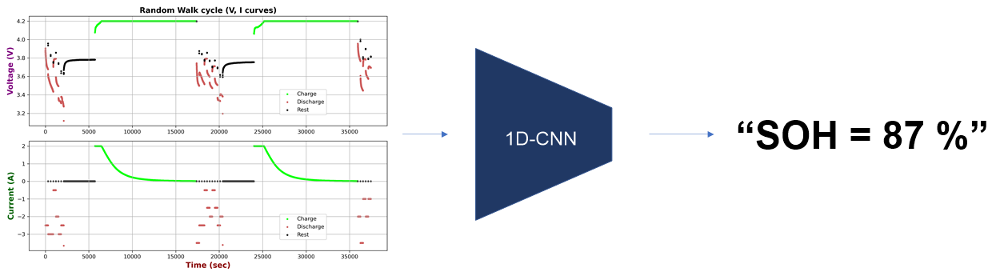

In [5]:
Img(filename='/home/ev/ksiam/models/model_encoder.png') 

## SOH prediction result

- Model : 1-D CNN
- Train : 400 Epochs
- Loss Function : MSE (in train)
- Evaluation Metric : MAE (in test)

In [6]:
filelist1 = ['soh_171819_20', 'soh_171820_19', 'soh_171920_18', 'soh_181920_17']

filelist2 = [['demo_1718_1920', 'RW1920'],
            ['demo_1719_1820', 'RW1820'], 
            ['demo_1819_1720', 'RW1720'],
            ['demo_1720_1819', 'RW1819'], 
            ['demo_1820_1719', 'RW1719'],
            ['demo_1920_1718', 'RW1718']]

In [7]:
def SOHmaeplot(filenum):
    os.makedirs(f'/home/ess/year345/231013/{filenum}', exist_ok=True)
    mae_epoch = 400

    with open(f'/home/ev/ksiam/logs/{filenum}/soh_mae/soh_mae_plot.txt') as f:
        EG = f.read().splitlines()
    EG = list(map(float, EG))

    fig, ax = plt.subplots(figsize=(10, 5))

    for epoch in range(0, mae_epoch):
        ax.clear()
        ax.plot(range(0, epoch+1), EG[:epoch+1], color='orangered', label=filenum)
        ax.set_xlim([0, mae_epoch])
        ax.set_xlabel("Epoch")
        ax.set_xticks(np.arange(0, mae_epoch, 100))
        ax.set_ylim([0, 0.2])
        ax.set_ylabel("MAE(SOH)")
        ax.set_yticks(np.arange(0, 0.2, 0.05))
        ax.set_title(f"Epoch {epoch}")
        ax.grid()
        ax.axhline(0.03, 0, 1, color='lightgray', linestyle='--', linewidth=2)
        ax.legend(loc='upper right')
        ax.figure.savefig(f'/home/ess/year345/231013/{filenum}/{str(epoch).zfill(5)}.png')
                 

    visualize_step = os.listdir(f'/home/ess/year345/231013/{filenum}')
    visualize_step.sort()
    frames = [imageio.imread(os.path.join(f'/home/ess/year345/231013/{filenum}', png)) for png in visualize_step[::5] if 'png' in png]
    imageio.mimsave(f'/home/ess/year345/231013/{filenum}/{filenum}.gif', frames, format='GIF', duration=10, loop=0)
    
def TLmaeplot(filenum):
    os.makedirs(f'/home/ess/year345/231013/{filenum[0]}', exist_ok=True)
    mae_epoch = 400

    with open(f'/home/ev/ksiam/logs/{filenum[0]}/soh_mae/soh_mae_plot.txt') as f:
        EG = f.read().splitlines()
    EG = list(map(float, EG)) # 실험군 experimental group

    with open(f'/home/ev/ksiam/logs/{filenum[1]}/soh_mae/soh_mae_plot.txt') as f:
        CG = f.read().splitlines()
    CG = list(map(float, CG)) # 대조군 comparison group

    fig, ax = plt.subplots(figsize=(10, 5))

    for epoch in range(0, mae_epoch):
        ax.clear()
        ax.plot(range(0, epoch+1), EG[:epoch+1], color='orangered', label=filenum[0])
        ax.plot(range(0, epoch+1), CG[:epoch+1], color='dimgray', label=filenum[1])
        ax.set_xlim([0, mae_epoch])
        ax.set_xlabel("Epoch")
        ax.set_xticks(np.arange(0, mae_epoch, 100))
        ax.set_ylim([0, 0.2])
        ax.set_ylabel("MAE(SOH)")
        ax.set_yticks(np.arange(0, 0.2, 0.05))
        ax.set_title(f"Epoch {epoch}")
        ax.grid()
        ax.axhline(0.03, 0, 1, color='lightgray', linestyle='--', linewidth=2)
        ax.legend(loc='upper right')
        ax.figure.savefig(f'/home/ess/year345/231013/{filenum[0]}/{str(epoch).zfill(5)}.png')
                 

    visualize_step = os.listdir(f'/home/ess/year345/231013/{filenum[0]}')
    visualize_step.sort()
    frames = [imageio.imread(os.path.join(f'/home/ess/year345/231013/{filenum[0]}', png)) for png in visualize_step[::5] if 'png' in png]
    imageio.mimsave(f'/home/ess/year345/231013/{filenum[0]}/{filenum[0]}.gif', frames, format='GIF', duration=10, loop=0)

|Train|Test|
|---|---|
|RW17, RW18, RW19|RW20|


In [9]:
ksiam = '/home/ev/ksiam/'
os.chdir(ksiam)

! python main.py --exp=soh_171819_20 --train_battery=17,18,19 --test_battery=20 --epoch=400 --seed=0


2023-10-30 13:41:24 Model Params: 25.699M
2023-10-30 13:41:25 Epoch 1 lr 9.950e-04 [Test] [SOH (MAE)] 1.033e-01 [Ri (RMSE)] 1.849e+01 Elapsed 0:00:00.991668
2023-10-30 13:41:26 Epoch 2 lr 9.900e-04 [Test] [SOH (MAE)] 1.001e-01 [Ri (RMSE)] 1.849e+01 Elapsed 0:00:01.169274
2023-10-30 13:41:26 Epoch 3 lr 9.851e-04 [Test] [SOH (MAE)] 9.267e-02 [Ri (RMSE)] 1.849e+01 Elapsed 0:00:01.352529
2023-10-30 13:41:26 Epoch 4 lr 9.801e-04 [Test] [SOH (MAE)] 9.165e-02 [Ri (RMSE)] 1.849e+01 Elapsed 0:00:01.547186
2023-10-30 13:41:26 Epoch 5 lr 9.752e-04 [Test] [SOH (MAE)] 9.564e-02 [Ri (RMSE)] 1.849e+01 Elapsed 0:00:01.727967
2023-10-30 13:41:26 Epoch 6 lr 9.704e-04 [Test] [SOH (MAE)] 8.257e-02 [Ri (RMSE)] 1.849e+01 Elapsed 0:00:01.907112
2023-10-30 13:41:27 Epoch 7 lr 9.655e-04 [Test] [SOH (MAE)] 8.125e-02 [Ri (RMSE)] 1.849e+01 Elapsed 0:00:02.095596
2023-10-30 13:41:27 Epoch 8 lr 9.607e-04 [Test] [SOH (MAE)] 8.703e-02 [Ri (RMSE)] 1.849e+01 Elapsed 0:00:02.279738
2023-10-30 13:41:27 Epoch 9 lr 9.559e-

After inference, MAE is 0.02355748438490518


/tmp/ipykernel_2314820/24733249.py:29: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames = [imageio.imread(os.path.join(f'/home/ess/year345/231013/{filenum}', png)) for png in visualize_step[::5] if 'png' in png]


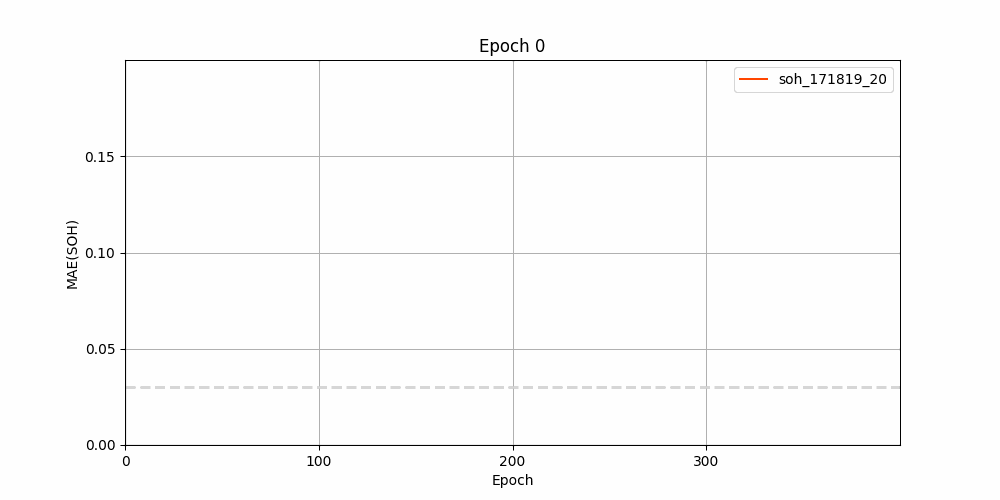

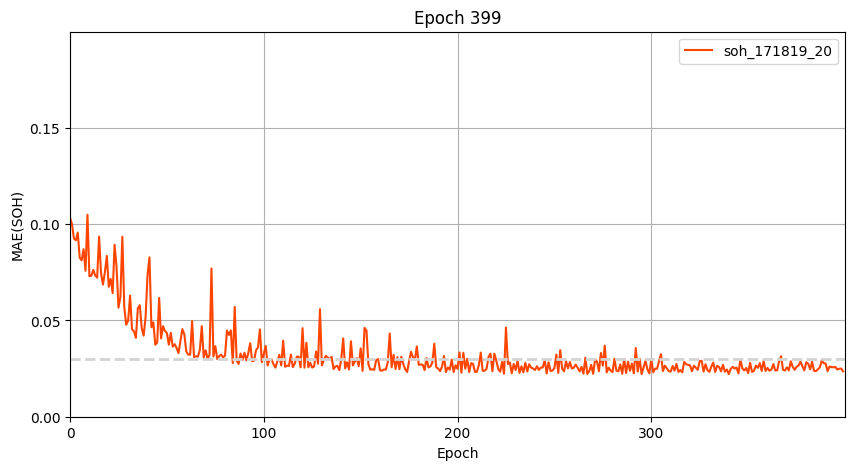

In [10]:
with open(f'/home/ev/ksiam/logs/soh_171819_20/soh_mae/soh_mae_plot.txt') as f:
    EG = f.read().splitlines()
EG = list(map(float, EG))

print('After inference, MAE is',EG[-1])

SOHmaeplot(filelist1[0])
Img(filename='/home/ess/year345/231013/soh_171819_20/soh_171819_20.gif')

|Train|Test|
|---|---|
|RW17, RW18, RW20|RW19|


In [30]:
! python main.py --exp=soh_171820_19 --train_battery=17,18,20 --test_battery=19 --epoch=400 --seed=0

2023-10-27 10:52:15 Model Params: 25.699M
2023-10-27 10:52:17 Epoch 1 lr 9.950e-04 [Test] [SOH (MAE)] 1.071e-01 [Ri (RMSE)] 1.777e+01 Elapsed 0:00:01.128542
2023-10-27 10:52:18 Epoch 2 lr 9.900e-04 [Test] [SOH (MAE)] 9.579e-02 [Ri (RMSE)] 1.777e+01 Elapsed 0:00:01.336755
2023-10-27 10:52:18 Epoch 3 lr 9.851e-04 [Test] [SOH (MAE)] 9.357e-02 [Ri (RMSE)] 1.777e+01 Elapsed 0:00:01.543131
2023-10-27 10:52:18 Epoch 4 lr 9.801e-04 [Test] [SOH (MAE)] 8.865e-02 [Ri (RMSE)] 1.777e+01 Elapsed 0:00:01.749829
2023-10-27 10:52:18 Epoch 5 lr 9.752e-04 [Test] [SOH (MAE)] 8.394e-02 [Ri (RMSE)] 1.777e+01 Elapsed 0:00:01.956170
2023-10-27 10:52:18 Epoch 6 lr 9.704e-04 [Test] [SOH (MAE)] 8.107e-02 [Ri (RMSE)] 1.777e+01 Elapsed 0:00:02.162452
2023-10-27 10:52:19 Epoch 7 lr 9.655e-04 [Test] [SOH (MAE)] 8.077e-02 [Ri (RMSE)] 1.777e+01 Elapsed 0:00:02.368773
2023-10-27 10:52:19 Epoch 8 lr 9.607e-04 [Test] [SOH (MAE)] 7.521e-02 [Ri (RMSE)] 1.777e+01 Elapsed 0:00:02.575026
2023-10-27 10:52:19 Epoch 9 lr 9.559e-

After inference, MAE is 0.02352515966422005


/tmp/ipykernel_2184792/24733249.py:29: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames = [imageio.imread(os.path.join(f'/home/ess/year345/231013/{filenum}', png)) for png in visualize_step[::5] if 'png' in png]


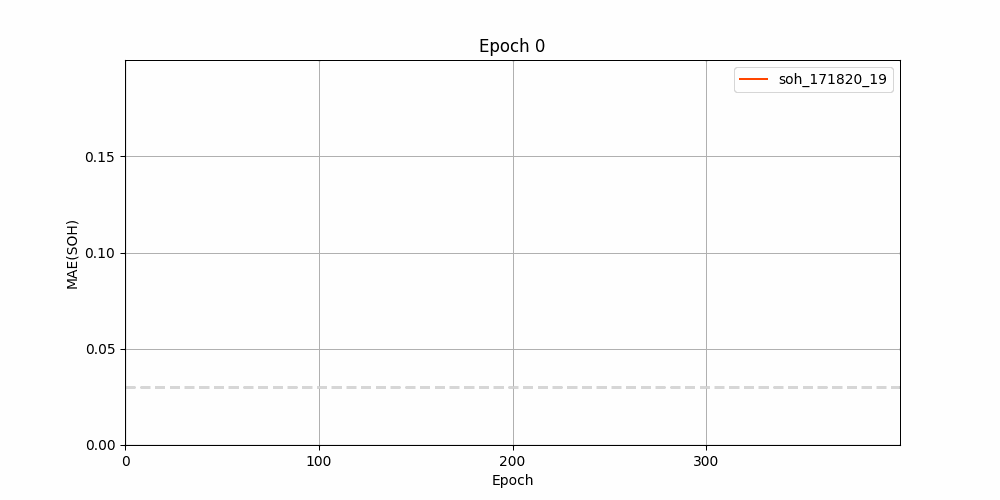

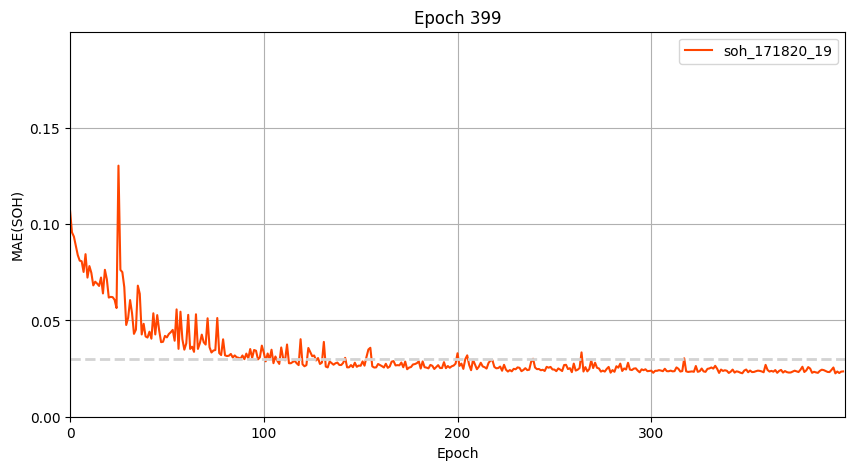

In [31]:
with open(f'/home/ev/ksiam/logs/soh_171820_19/soh_mae/soh_mae_plot.txt') as f:
    EG = f.read().splitlines()
EG = list(map(float, EG))

print('After inference, MAE is',EG[-1])

SOHmaeplot(filelist1[1])
Img(filename='/home/ess/year345/231013/soh_171820_19/soh_171820_19.gif')

|Train|Test|
|---|---|
|RW17, RW19, RW20|RW18|


In [32]:
! python main.py --exp=soh_171920_18 --train_battery=17,19,20 --test_battery=18 --epoch=400 --seed=0

2023-10-27 10:54:10 Model Params: 25.699M
2023-10-27 10:54:12 Epoch 1 lr 9.950e-04 [Test] [SOH (MAE)] 1.549e-01 [Ri (RMSE)] 1.746e+01 Elapsed 0:00:01.091297
2023-10-27 10:54:12 Epoch 2 lr 9.900e-04 [Test] [SOH (MAE)] 1.037e-01 [Ri (RMSE)] 1.746e+01 Elapsed 0:00:01.268758
2023-10-27 10:54:12 Epoch 3 lr 9.851e-04 [Test] [SOH (MAE)] 1.018e-01 [Ri (RMSE)] 1.746e+01 Elapsed 0:00:01.445478
2023-10-27 10:54:12 Epoch 4 lr 9.801e-04 [Test] [SOH (MAE)] 9.860e-02 [Ri (RMSE)] 1.746e+01 Elapsed 0:00:01.621612
2023-10-27 10:54:13 Epoch 5 lr 9.752e-04 [Test] [SOH (MAE)] 9.368e-02 [Ri (RMSE)] 1.746e+01 Elapsed 0:00:01.806021
2023-10-27 10:54:13 Epoch 6 lr 9.704e-04 [Test] [SOH (MAE)] 9.301e-02 [Ri (RMSE)] 1.746e+01 Elapsed 0:00:01.987130
2023-10-27 10:54:13 Epoch 7 lr 9.655e-04 [Test] [SOH (MAE)] 8.773e-02 [Ri (RMSE)] 1.746e+01 Elapsed 0:00:02.163392
2023-10-27 10:54:13 Epoch 8 lr 9.607e-04 [Test] [SOH (MAE)] 8.595e-02 [Ri (RMSE)] 1.746e+01 Elapsed 0:00:02.340032
2023-10-27 10:54:13 Epoch 9 lr 9.559e-

After inference, MAE is 0.026612792969771065


/tmp/ipykernel_2184792/24733249.py:29: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames = [imageio.imread(os.path.join(f'/home/ess/year345/231013/{filenum}', png)) for png in visualize_step[::5] if 'png' in png]


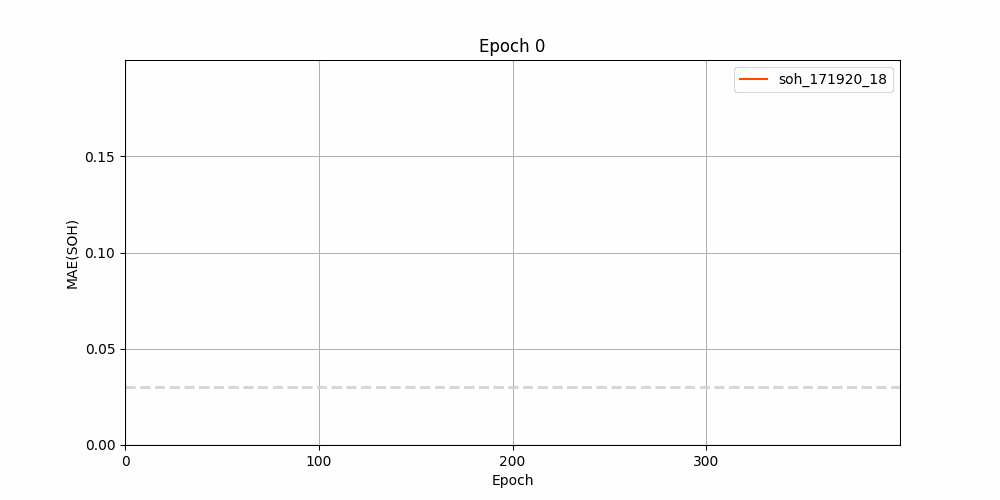

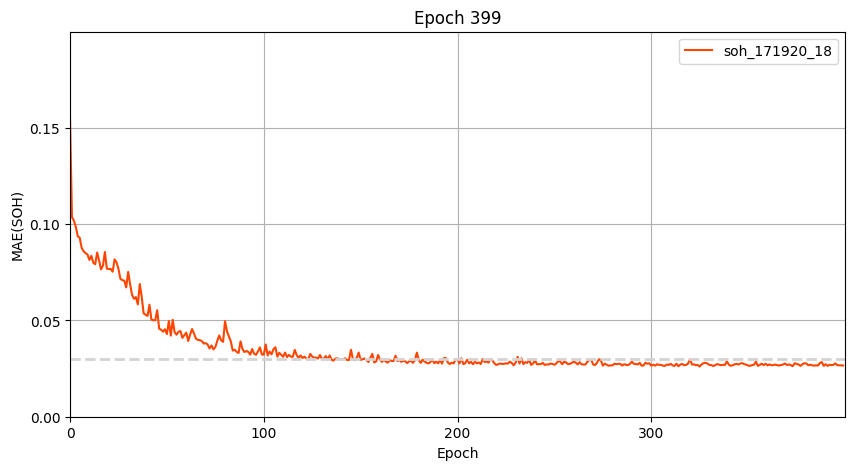

In [33]:
with open(f'/home/ev/ksiam/logs/soh_171920_18/soh_mae/soh_mae_plot.txt') as f:
    EG = f.read().splitlines()
EG = list(map(float, EG))

print('After inference, MAE is',EG[-1])

SOHmaeplot(filelist1[2])
Img(filename='/home/ess/year345/231013/soh_171920_18/soh_171920_18.gif')

|Train|Test|
|---|---|
|RW18, RW19, RW20|RW17|


In [34]:
! python main.py --exp=soh_181920_17 --train_battery=18,19,20 --test_battery=17 --epoch=400 --seed=0

2023-10-27 10:56:03 Model Params: 25.699M
2023-10-27 10:56:05 Epoch 1 lr 9.950e-04 [Test] [SOH (MAE)] 8.986e-02 [Ri (RMSE)] 1.858e+01 Elapsed 0:00:01.010028
2023-10-27 10:56:05 Epoch 2 lr 9.900e-04 [Test] [SOH (MAE)] 8.662e-02 [Ri (RMSE)] 1.858e+01 Elapsed 0:00:01.187326
2023-10-27 10:56:06 Epoch 3 lr 9.851e-04 [Test] [SOH (MAE)] 8.362e-02 [Ri (RMSE)] 1.858e+01 Elapsed 0:00:01.363276
2023-10-27 10:56:06 Epoch 4 lr 9.801e-04 [Test] [SOH (MAE)] 7.976e-02 [Ri (RMSE)] 1.858e+01 Elapsed 0:00:01.539468
2023-10-27 10:56:06 Epoch 5 lr 9.752e-04 [Test] [SOH (MAE)] 7.827e-02 [Ri (RMSE)] 1.858e+01 Elapsed 0:00:01.722024
2023-10-27 10:56:06 Epoch 6 lr 9.704e-04 [Test] [SOH (MAE)] 6.941e-02 [Ri (RMSE)] 1.858e+01 Elapsed 0:00:01.898606
2023-10-27 10:56:06 Epoch 7 lr 9.655e-04 [Test] [SOH (MAE)] 6.941e-02 [Ri (RMSE)] 1.858e+01 Elapsed 0:00:02.074545
2023-10-27 10:56:06 Epoch 8 lr 9.607e-04 [Test] [SOH (MAE)] 6.919e-02 [Ri (RMSE)] 1.858e+01 Elapsed 0:00:02.252821
2023-10-27 10:56:07 Epoch 9 lr 9.559e-

After inference, MAE is 0.023069734531272704


/tmp/ipykernel_2184792/24733249.py:29: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames = [imageio.imread(os.path.join(f'/home/ess/year345/231013/{filenum}', png)) for png in visualize_step[::5] if 'png' in png]


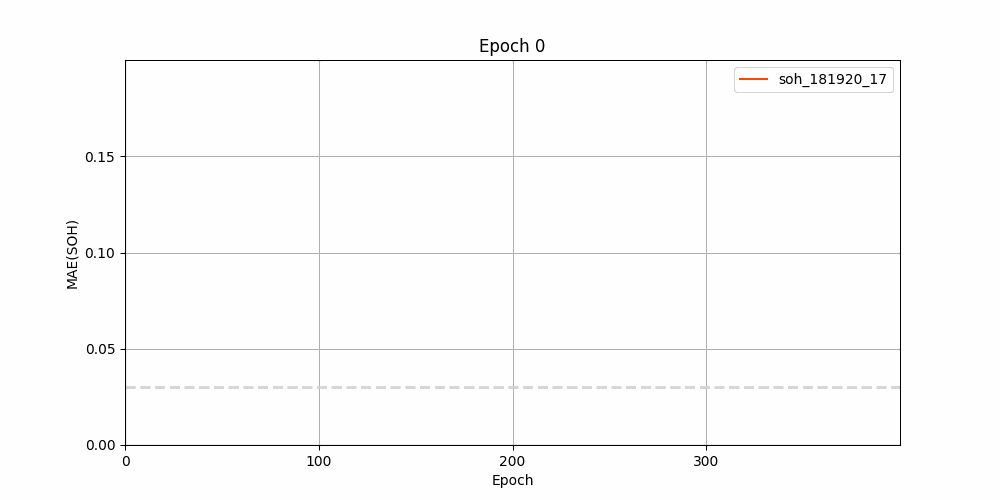

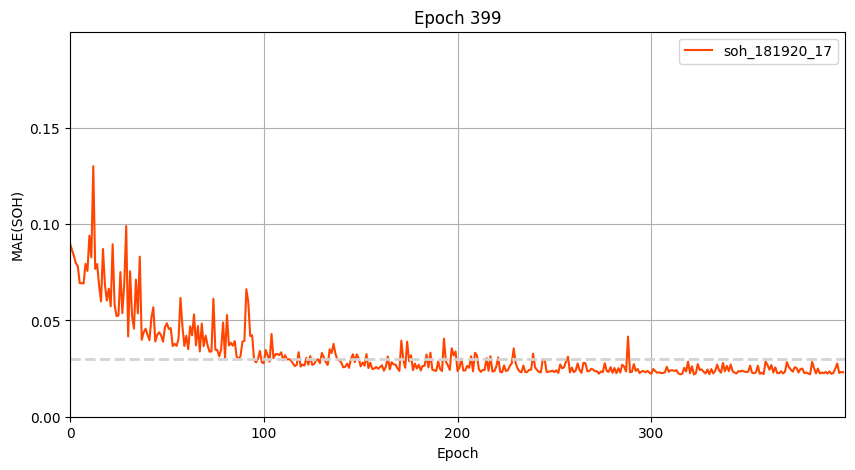

In [35]:
with open(f'/home/ev/ksiam/logs/soh_181920_17/soh_mae/soh_mae_plot.txt') as f:
    EG = f.read().splitlines()
EG = list(map(float, EG))

print('After inference, MAE is',EG[-1])

SOHmaeplot(filelist1[3])
Img(filename='/home/ess/year345/231013/soh_181920_17/soh_181920_17.gif')

#### Transfer Learning

|Train|Test|-->|Train|Test|
|---|---|---|---|---|
|RW17|RW18|-->|RW19|RW20|


In [ ]:
! python main.py --exp=demo_1718_1920 --load_exp=RW1718 --train_battery=19 --test_battery=20 --epoch=400 --seed=49

After transfer learning, MAE is 0.02986605126660381
MAE of CG : 0.04443849495926605 , MAE of EG : 0.02986605126660381
The error rate has decreased by 48.79%


/tmp/ipykernel_2374638/24733249.py:65: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames = [imageio.imread(os.path.join(f'/home/ess/year345/231013/{filenum[0]}', png)) for png in visualize_step[::5] if 'png' in png]


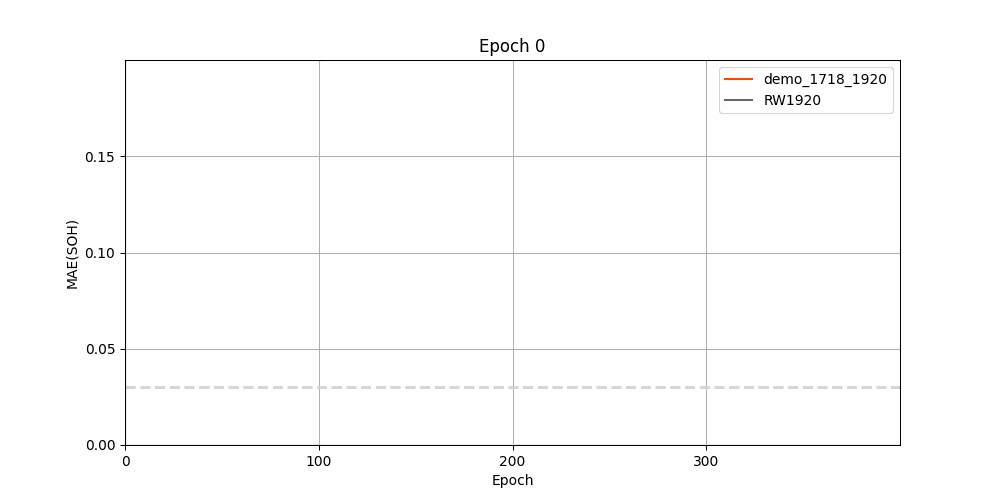

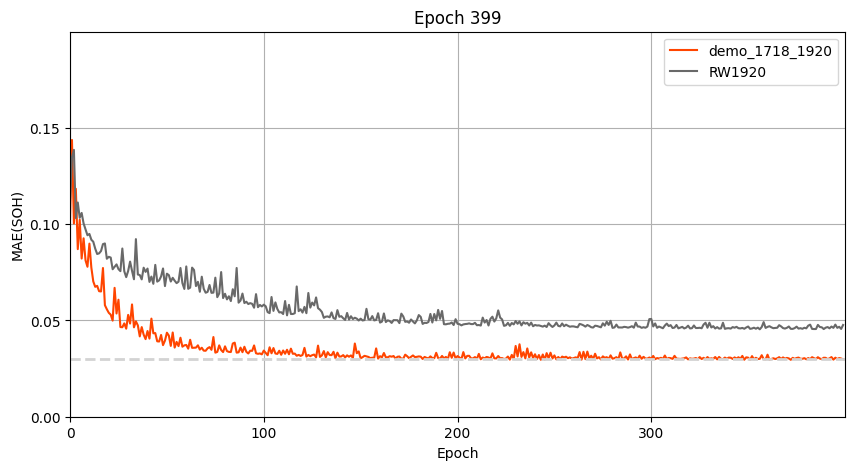

In [8]:
with open(f'/home/ev/ksiam/logs/demo_1718_1920/soh_mae/soh_mae_plot.txt') as f:
    EG = f.read().splitlines()
EG = list(map(float, EG))

with open(f'/home/ev/ksiam/logs/RW1920/soh_mae/soh_mae_plot.txt') as f:
    CG = f.read().splitlines()
CG = list(map(float, CG))

print('After transfer learning, MAE is',EG[-1])
print('MAE of CG :', CG[-1], ', MAE of EG :', EG[-1])
print('The error rate has decreased by {:.2f}%'.format(((CG[-1] - EG[-1])/EG[-1])*100))

TLmaeplot(filelist2[0])
Img(filename='/home/ess/year345/231013/demo_1718_1920/demo_1718_1920.gif')

|Train|Test|-->|Train|Test|
|---|---|---|---|---|
|RW17|RW19|-->|RW18|RW20|


In [38]:
! python main.py --exp=demo_1719_1820 --load_exp=RW1719 --train_battery=18 --test_battery=20 --epoch=400 --seed=35

2023-10-27 10:59:20 Model Params: 25.699M
2023-10-27 10:59:24 Epoch 1 lr 9.950e-04 [Test] [SOH (MAE)] 1.795e-01 [Ri (RMSE)] 7.140e-01 Elapsed 0:00:02.455140
2023-10-27 10:59:24 Epoch 2 lr 9.900e-04 [Test] [SOH (MAE)] 1.439e-01 [Ri (RMSE)] 7.140e-01 Elapsed 0:00:02.551935
2023-10-27 10:59:24 Epoch 3 lr 9.851e-04 [Test] [SOH (MAE)] 8.992e-02 [Ri (RMSE)] 7.140e-01 Elapsed 0:00:02.646442
2023-10-27 10:59:24 Epoch 4 lr 9.801e-04 [Test] [SOH (MAE)] 8.862e-02 [Ri (RMSE)] 7.140e-01 Elapsed 0:00:02.741187
2023-10-27 10:59:24 Epoch 5 lr 9.752e-04 [Test] [SOH (MAE)] 1.062e-01 [Ri (RMSE)] 7.140e-01 Elapsed 0:00:02.835806
2023-10-27 10:59:24 Epoch 6 lr 9.704e-04 [Test] [SOH (MAE)] 9.967e-02 [Ri (RMSE)] 7.140e-01 Elapsed 0:00:02.930419
2023-10-27 10:59:24 Epoch 7 lr 9.655e-04 [Test] [SOH (MAE)] 8.338e-02 [Ri (RMSE)] 7.140e-01 Elapsed 0:00:03.024805
2023-10-27 10:59:24 Epoch 8 lr 9.607e-04 [Test] [SOH (MAE)] 9.296e-02 [Ri (RMSE)] 7.140e-01 Elapsed 0:00:03.119394
2023-10-27 10:59:24 Epoch 9 lr 9.559e-

After transfer learning, MAE is 0.02921017898679876
MAE of CG : 0.041378286915602414 , MAE of EG : 0.02921017898679876
The error rate has decreased by 41.66%


/tmp/ipykernel_2184792/24733249.py:65: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames = [imageio.imread(os.path.join(f'/home/ess/year345/231013/{filenum[0]}', png)) for png in visualize_step[::5] if 'png' in png]


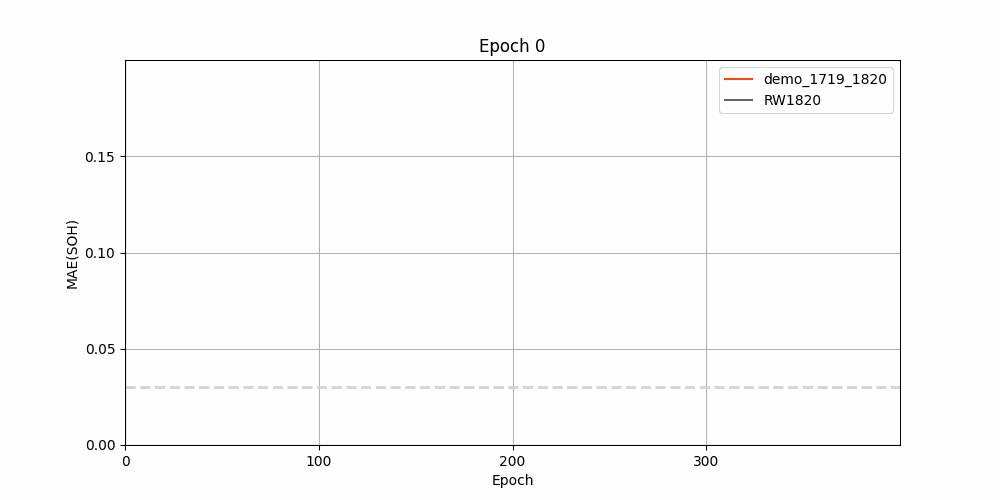

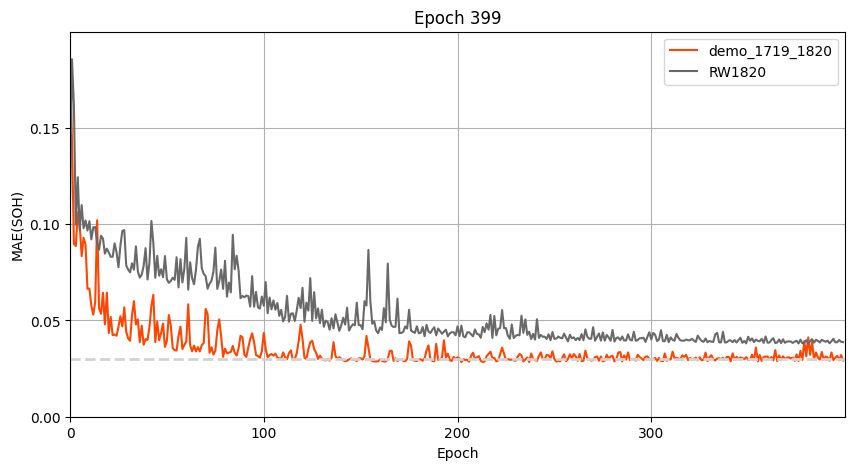

In [39]:
with open(f'/home/ev/ksiam/logs/demo_1719_1820/soh_mae/soh_mae_plot.txt') as f:
    EG = f.read().splitlines()
EG = list(map(float, EG))

with open(f'/home/ev/ksiam/logs/RW1820/soh_mae/soh_mae_plot.txt') as f:
    CG = f.read().splitlines()
CG = list(map(float, CG))

print('After transfer learning, MAE is',EG[-1])
print('MAE of CG :', CG[-1], ', MAE of EG :', EG[-1])
print('The error rate has decreased by {:.2f}%'.format(((CG[-1] - EG[-1])/EG[-1])*100))

TLmaeplot(filelist2[1])
Img(filename='/home/ess/year345/231013/demo_1719_1820/demo_1719_1820.gif')

|Train|Test|-->|Train|Test|
|---|---|---|---|---|
|RW18|RW19|-->|RW17|RW20|


In [40]:
! python main.py --exp=demo_1819_1720 --load_exp=RW1819 --train_battery=17 --test_battery=20 --epoch=400 --seed=23

2023-10-27 11:00:55 Model Params: 25.699M
2023-10-27 11:00:59 Epoch 1 lr 9.950e-04 [Test] [SOH (MAE)] 2.110e-01 [Ri (RMSE)] 4.363e-01 Elapsed 0:00:02.743359
2023-10-27 11:00:59 Epoch 2 lr 9.900e-04 [Test] [SOH (MAE)] 1.226e-01 [Ri (RMSE)] 4.363e-01 Elapsed 0:00:02.830432
2023-10-27 11:00:59 Epoch 3 lr 9.851e-04 [Test] [SOH (MAE)] 1.242e-01 [Ri (RMSE)] 4.363e-01 Elapsed 0:00:02.916980
2023-10-27 11:00:59 Epoch 4 lr 9.801e-04 [Test] [SOH (MAE)] 8.160e-02 [Ri (RMSE)] 4.363e-01 Elapsed 0:00:03.002690
2023-10-27 11:00:59 Epoch 5 lr 9.752e-04 [Test] [SOH (MAE)] 7.667e-02 [Ri (RMSE)] 4.363e-01 Elapsed 0:00:03.088290
2023-10-27 11:00:59 Epoch 6 lr 9.704e-04 [Test] [SOH (MAE)] 8.373e-02 [Ri (RMSE)] 4.363e-01 Elapsed 0:00:03.173925
2023-10-27 11:01:00 Epoch 7 lr 9.655e-04 [Test] [SOH (MAE)] 7.488e-02 [Ri (RMSE)] 4.363e-01 Elapsed 0:00:03.259441
2023-10-27 11:01:00 Epoch 8 lr 9.607e-04 [Test] [SOH (MAE)] 7.425e-02 [Ri (RMSE)] 4.363e-01 Elapsed 0:00:03.344974
2023-10-27 11:01:00 Epoch 9 lr 9.559e-

After transfer learning, MAE is 0.02923039569178016
MAE of CG : 0.044387756603306135 , MAE of EG : 0.02923039569178016
The error rate has decreased by 51.85%


/tmp/ipykernel_2184792/24733249.py:65: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames = [imageio.imread(os.path.join(f'/home/ess/year345/231013/{filenum[0]}', png)) for png in visualize_step[::5] if 'png' in png]


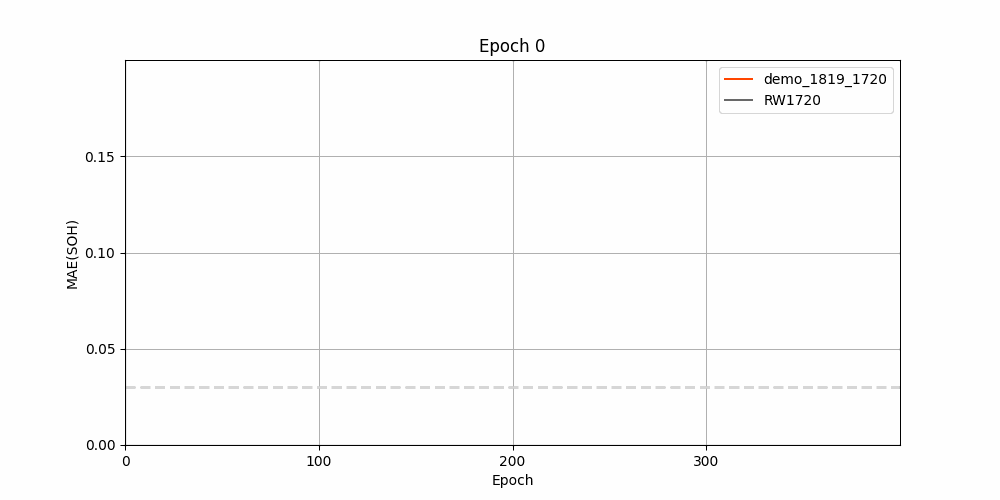

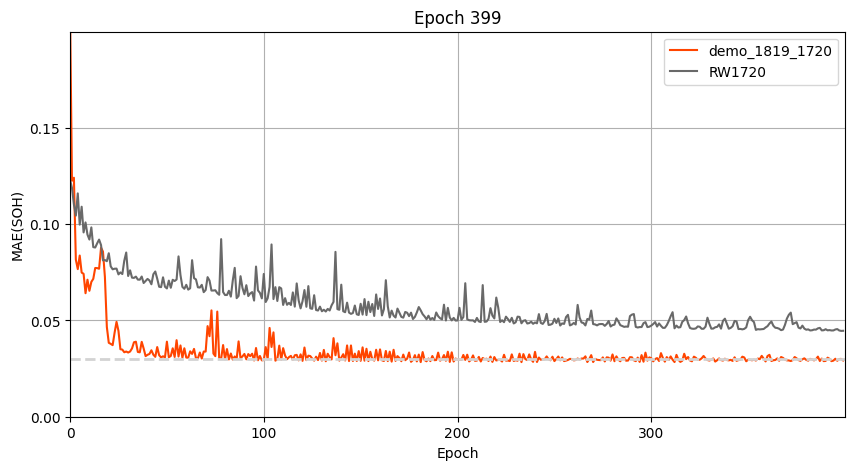

In [41]:
with open(f'/home/ev/ksiam/logs/demo_1819_1720/soh_mae/soh_mae_plot.txt') as f:
    EG = f.read().splitlines()
EG = list(map(float, EG))

with open(f'/home/ev/ksiam/logs/RW1720/soh_mae/soh_mae_plot.txt') as f:
    CG = f.read().splitlines()
CG = list(map(float, CG))

print('After transfer learning, MAE is',EG[-1])
print('MAE of CG :', CG[-1], ', MAE of EG :', EG[-1])
print('The error rate has decreased by {:.2f}%'.format(((CG[-1] - EG[-1])/EG[-1])*100))

TLmaeplot(filelist2[2])
Img(filename='/home/ess/year345/231013/demo_1819_1720/demo_1819_1720.gif')

|Train|Test|-->|Train|Test|
|---|---|---|---|---|
|RW17|RW20|-->|RW18|RW19|


In [42]:
! python main.py --exp=demo_1720_1819 --load_exp=RW1720 --train_battery=18 --test_battery=19 --epoch=400 --seed=23

2023-10-27 11:02:19 Model Params: 25.699M
2023-10-27 11:02:26 Epoch 1 lr 9.950e-04 [Test] [SOH (MAE)] 2.005e-01 [Ri (RMSE)] 8.065e-01 Elapsed 0:00:05.059634
2023-10-27 11:02:27 Epoch 2 lr 9.900e-04 [Test] [SOH (MAE)] 1.378e-01 [Ri (RMSE)] 8.065e-01 Elapsed 0:00:05.212734
2023-10-27 11:02:27 Epoch 3 lr 9.851e-04 [Test] [SOH (MAE)] 1.111e-01 [Ri (RMSE)] 8.065e-01 Elapsed 0:00:05.366042
2023-10-27 11:02:27 Epoch 4 lr 9.801e-04 [Test] [SOH (MAE)] 9.908e-02 [Ri (RMSE)] 8.065e-01 Elapsed 0:00:05.518046
2023-10-27 11:02:27 Epoch 5 lr 9.752e-04 [Test] [SOH (MAE)] 9.671e-02 [Ri (RMSE)] 8.065e-01 Elapsed 0:00:05.660447
2023-10-27 11:02:27 Epoch 6 lr 9.704e-04 [Test] [SOH (MAE)] 1.005e-01 [Ri (RMSE)] 8.065e-01 Elapsed 0:00:05.809489
2023-10-27 11:02:27 Epoch 7 lr 9.655e-04 [Test] [SOH (MAE)] 8.911e-02 [Ri (RMSE)] 8.065e-01 Elapsed 0:00:05.953407
2023-10-27 11:02:28 Epoch 8 lr 9.607e-04 [Test] [SOH (MAE)] 8.635e-02 [Ri (RMSE)] 8.065e-01 Elapsed 0:00:06.090617
2023-10-27 11:02:28 Epoch 9 lr 9.559e-

After transfer learning, MAE is 0.030438954717422716
MAE of CG : 0.03602918676576537 , MAE of EG : 0.030438954717422716
The error rate has decreased by 18.37%


/tmp/ipykernel_2184792/24733249.py:65: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames = [imageio.imread(os.path.join(f'/home/ess/year345/231013/{filenum[0]}', png)) for png in visualize_step[::5] if 'png' in png]


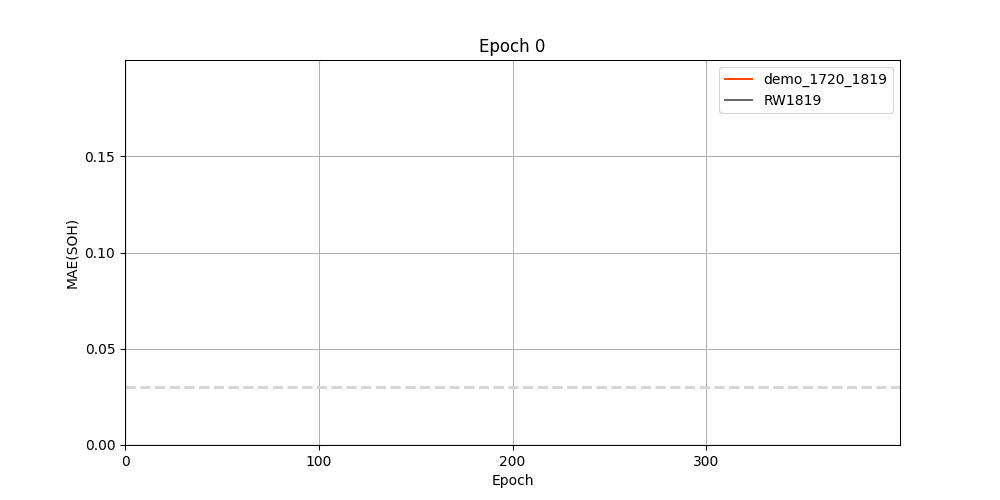

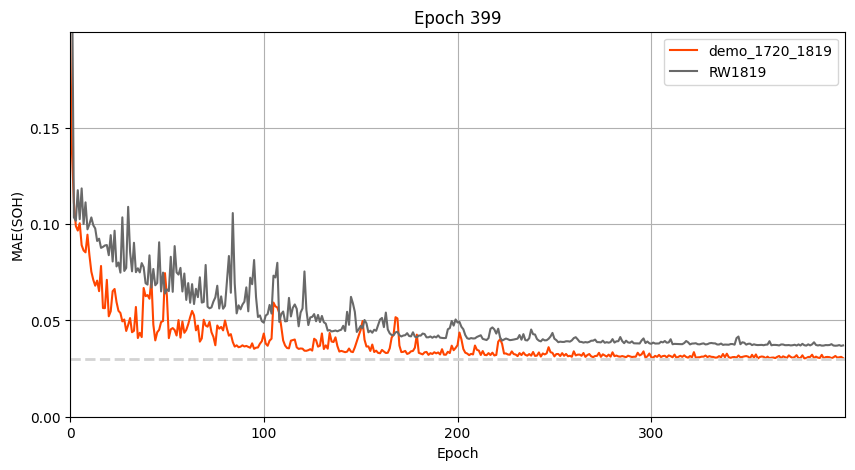

In [43]:
with open(f'/home/ev/ksiam/logs/demo_1720_1819/soh_mae/soh_mae_plot.txt') as f:
    EG = f.read().splitlines()
EG = list(map(float, EG))

with open(f'/home/ev/ksiam/logs/RW1819/soh_mae/soh_mae_plot.txt') as f:
    CG = f.read().splitlines()
CG = list(map(float, CG))

print('After transfer learning, MAE is',EG[-1])
print('MAE of CG :', CG[-1], ', MAE of EG :', EG[-1])
print('The error rate has decreased by {:.2f}%'.format(((CG[-1] - EG[-1])/EG[-1])*100))

TLmaeplot(filelist2[3])
Img(filename='/home/ess/year345/231013/demo_1720_1819/demo_1720_1819.gif')

|Train|Test|-->|Train|Test|
|---|---|---|---|---|
|RW18|RW20|-->|RW17|RW19|


In [44]:
! python main.py --exp=demo_1820_1719 --load_exp=RW1820 --train_battery=17 --test_battery=19 --epoch=400 --seed=158

2023-10-27 11:03:53 Model Params: 25.699M
2023-10-27 11:04:01 Epoch 1 lr 9.950e-04 [Test] [SOH (MAE)] 1.541e-01 [Ri (RMSE)] 7.428e-01 Elapsed 0:00:05.411806
2023-10-27 11:04:01 Epoch 2 lr 9.900e-04 [Test] [SOH (MAE)] 1.575e-01 [Ri (RMSE)] 7.428e-01 Elapsed 0:00:05.551115
2023-10-27 11:04:01 Epoch 3 lr 9.851e-04 [Test] [SOH (MAE)] 1.246e-01 [Ri (RMSE)] 7.428e-01 Elapsed 0:00:05.684484
2023-10-27 11:04:01 Epoch 4 lr 9.801e-04 [Test] [SOH (MAE)] 1.186e-01 [Ri (RMSE)] 7.428e-01 Elapsed 0:00:05.818757
2023-10-27 11:04:01 Epoch 5 lr 9.752e-04 [Test] [SOH (MAE)] 9.968e-02 [Ri (RMSE)] 7.428e-01 Elapsed 0:00:05.952879
2023-10-27 11:04:01 Epoch 6 lr 9.704e-04 [Test] [SOH (MAE)] 9.812e-02 [Ri (RMSE)] 7.428e-01 Elapsed 0:00:06.074178
2023-10-27 11:04:01 Epoch 7 lr 9.655e-04 [Test] [SOH (MAE)] 8.893e-02 [Ri (RMSE)] 7.428e-01 Elapsed 0:00:06.309140
2023-10-27 11:04:02 Epoch 8 lr 9.607e-04 [Test] [SOH (MAE)] 8.970e-02 [Ri (RMSE)] 7.428e-01 Elapsed 0:00:06.416905
2023-10-27 11:04:02 Epoch 9 lr 9.559e-

After transfer learning, MAE is 0.032968397921481894
MAE of CG : 0.04109635375087786 , MAE of EG : 0.032968397921481894
The error rate has decreased by 24.65%


/tmp/ipykernel_2184792/24733249.py:65: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames = [imageio.imread(os.path.join(f'/home/ess/year345/231013/{filenum[0]}', png)) for png in visualize_step[::5] if 'png' in png]


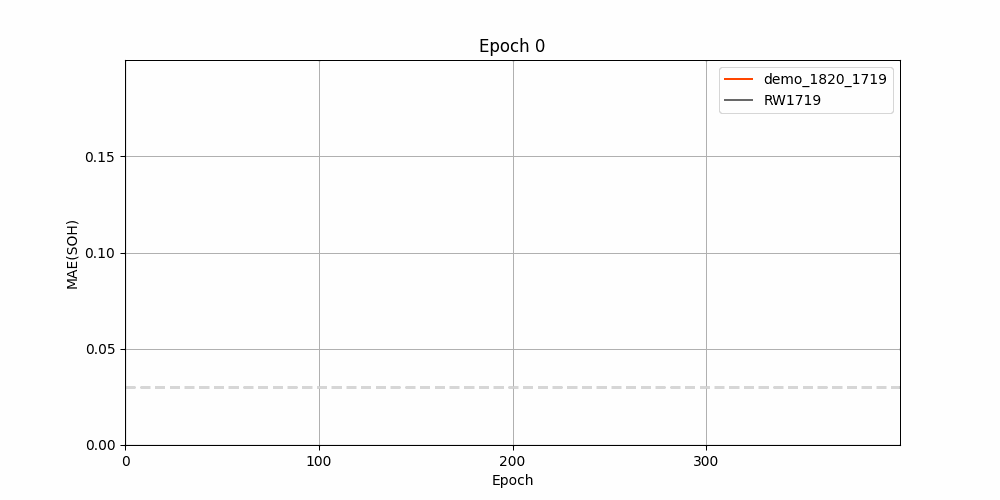

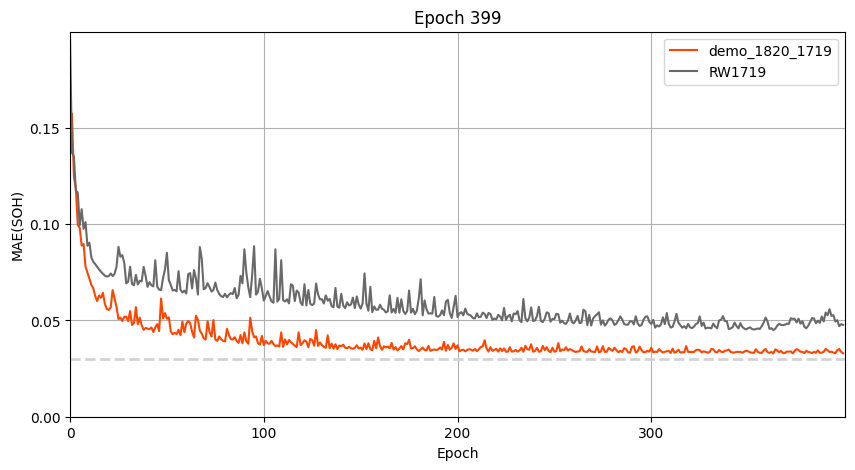

In [45]:
with open(f'/home/ev/ksiam/logs/demo_1820_1719/soh_mae/soh_mae_plot.txt') as f:
    EG = f.read().splitlines()
EG = list(map(float, EG))

with open(f'/home/ev/ksiam/logs/RW1719/soh_mae/soh_mae_plot.txt') as f:
    CG = f.read().splitlines()
CG = list(map(float, CG))

print('After transfer learning, MAE is',EG[-1])
print('MAE of CG :', CG[-1], ', MAE of EG :', EG[-1])
print('The error rate has decreased by {:.2f}%'.format(((CG[-1] - EG[-1])/EG[-1])*100))

TLmaeplot(filelist2[4])
Img(filename='/home/ess/year345/231013/demo_1820_1719/demo_1820_1719.gif')

|Train|Test|-->|Train|Test|
|---|---|---|---|---|
|RW19|RW20|-->|RW17|RW18|


In [46]:
! python main.py --exp=demo_1920_1718 --load_exp=RW1920 --train_battery=17 --test_battery=18 --epoch=400 --seed=132

2023-10-27 11:05:33 Model Params: 25.699M
2023-10-27 11:05:37 Epoch 1 lr 9.950e-04 [Test] [SOH (MAE)] 3.045e-01 [Ri (RMSE)] 7.580e-01 Elapsed 0:00:02.489639
2023-10-27 11:05:37 Epoch 2 lr 9.900e-04 [Test] [SOH (MAE)] 1.108e-01 [Ri (RMSE)] 7.580e-01 Elapsed 0:00:02.588529
2023-10-27 11:05:38 Epoch 3 lr 9.851e-04 [Test] [SOH (MAE)] 1.004e-01 [Ri (RMSE)] 7.580e-01 Elapsed 0:00:02.686929
2023-10-27 11:05:38 Epoch 4 lr 9.801e-04 [Test] [SOH (MAE)] 1.082e-01 [Ri (RMSE)] 7.580e-01 Elapsed 0:00:02.785155
2023-10-27 11:05:38 Epoch 5 lr 9.752e-04 [Test] [SOH (MAE)] 1.039e-01 [Ri (RMSE)] 7.580e-01 Elapsed 0:00:02.884868
2023-10-27 11:05:38 Epoch 6 lr 9.704e-04 [Test] [SOH (MAE)] 9.269e-02 [Ri (RMSE)] 7.580e-01 Elapsed 0:00:02.982251
2023-10-27 11:05:38 Epoch 7 lr 9.655e-04 [Test] [SOH (MAE)] 9.208e-02 [Ri (RMSE)] 7.580e-01 Elapsed 0:00:03.079115
2023-10-27 11:05:38 Epoch 8 lr 9.607e-04 [Test] [SOH (MAE)] 8.436e-02 [Ri (RMSE)] 7.580e-01 Elapsed 0:00:03.177428
2023-10-27 11:05:38 Epoch 9 lr 9.559e-

After transfer learning, MAE is 0.03813787292872558
MAE of CG : 0.04130409744107494 , MAE of EG : 0.03813787292872558
The error rate has decreased by 8.30%


/tmp/ipykernel_2184792/24733249.py:65: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames = [imageio.imread(os.path.join(f'/home/ess/year345/231013/{filenum[0]}', png)) for png in visualize_step[::5] if 'png' in png]


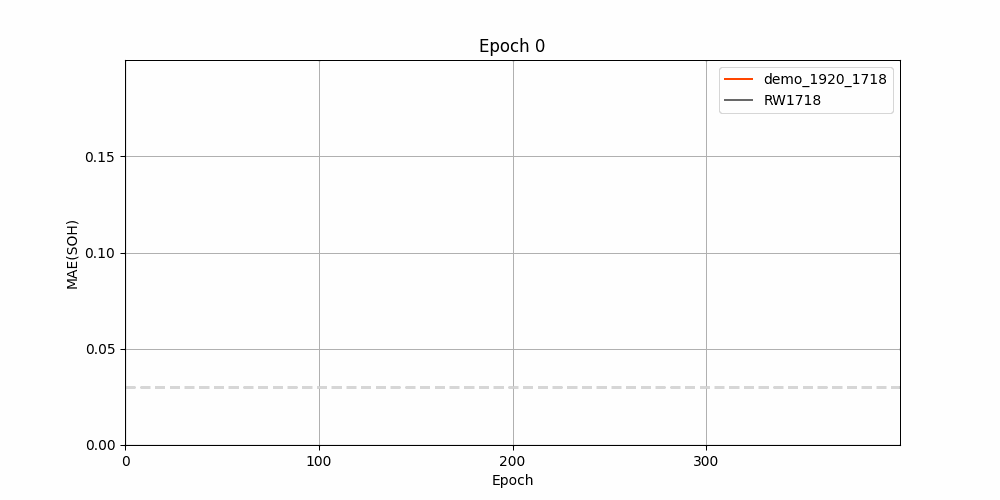

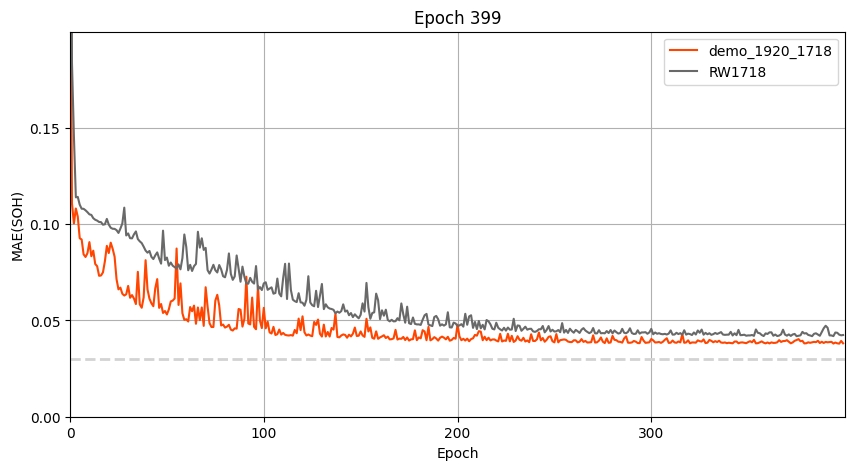

In [47]:
with open(f'/home/ev/ksiam/logs/demo_1920_1718/soh_mae/soh_mae_plot.txt') as f:
    EG = f.read().splitlines()
EG = list(map(float, EG))

with open(f'/home/ev/ksiam/logs/RW1718/soh_mae/soh_mae_plot.txt') as f:
    CG = f.read().splitlines()
CG = list(map(float, CG))

print('After transfer learning, MAE is',EG[-1])
print('MAE of CG :', CG[-1], ', MAE of EG :', EG[-1])
print('The error rate has decreased by {:.2f}%'.format(((CG[-1] - EG[-1])/EG[-1])*100))

TLmaeplot(filelist2[5])
Img(filename='/home/ess/year345/231013/demo_1920_1718/demo_1920_1718.gif')